<a href="https://colab.research.google.com/github/DarinJoshua-dev/DO101-apps/blob/master/Text_Emotion_Analysis_v3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import string
import numpy as np
import io

In [ ]:
import tensorflow as tf
import nltk
nltk.download('all')

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/abc.zip.
[nltk_data]    | Downloading package alpino to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/alpino.zip.
[nltk_data]    | Downloading package biocreative_ppi to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping corpora/biocreative_ppi.zip.
[nltk_data]    | Downloading package brown to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/brown.zip.
[nltk_data]    | Downloading package brown_tei to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/brown_tei.zip.
[nltk_data]    | Downloading package cess_cat to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/cess_cat.zip.
[nltk_data]    | Downloading package cess_esp to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/cess_esp.zip.
[nltk_data]    | Downloading package chat80 to /root/nltk_data...
[nltk_data]    |   Unzipp

True

In [ ]:
# Upload from google drive
from google.colab import files
uploaded = files.upload()
print("len(uploaded.keys():", len(uploaded.keys()))

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(name=fn, length=len(uploaded[fn])))

# Get list of emotion and text dataset
df_emotion= pd.read_csv(io.BytesIO(uploaded['text_emotion.csv']),encoding = "ISO-8859-1")

Saving text_emotion.csv to text_emotion.csv
len(uploaded.keys(): 1
User uploaded file "text_emotion.csv" with length 4213490 bytes


In [ ]:
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.sentiment.vader import SentimentIntensityAnalyzer

/usr/local/lib/python3.6/dist-packages/nltk/twitter/__init__.py:20: UserWarning: The twython library has not been installed. Some functionality from the twitter package will not be available.
  warnings.warn("The twython library has not been installed. "


In [ ]:
from collections import Counter

In [ ]:
print(df_emotion.columns)
print(df_emotion.index)

Index(['tweet_id', 'sentiment', 'author', 'content'], dtype='object')
RangeIndex(start=0, stop=40000, step=1)


In [ ]:
print(df_emotion['sentiment'])

0             empty
1           sadness
2           sadness
3        enthusiasm
4           neutral
            ...    
39995       neutral
39996          love
39997          love
39998     happiness
39999          love
Name: sentiment, Length: 40000, dtype: object


In [ ]:
df_emotion

,tweet_id,sentiment,author,content
0,1956967341,empty,xoshayzers,@tiffanylue i know i was listenin to bad habi...
1,1956967666,sadness,wannamama,Layin n bed with a headache ughhhh...waitin o...
2,1956967696,sadness,coolfunky,Funeral ceremony...gloomy friday...
3,1956967789,enthusiasm,czareaquino,wants to hang out with friends SOON!
4,1956968416,neutral,xkilljoyx,@dannycastillo We want to trade with someone w...
...,...,...,...,...
39995,1753918954,neutral,showMe_Heaven,@JohnLloydTaylor
39996,1753919001,love,drapeaux,Happy Mothers Day All my love
39997,1753919005,love,JenniRox,Happy Mother's Day to all the mommies out ther...
39998,1753919043,happiness,ipdaman1,@niariley WASSUP BEAUTIFUL!!! FOLLOW ME!! PEE...


In [ ]:
df_emotion.head()

,tweet_id,sentiment,author,content
0,1956967341,empty,xoshayzers,@tiffanylue i know i was listenin to bad habi...
1,1956967666,sadness,wannamama,Layin n bed with a headache ughhhh...waitin o...
2,1956967696,sadness,coolfunky,Funeral ceremony...gloomy friday...
3,1956967789,enthusiasm,czareaquino,wants to hang out with friends SOON!
4,1956968416,neutral,xkilljoyx,@dannycastillo We want to trade with someone w...


In [ ]:
df_emotion.loc[26470] 

tweet_id                                   1695410953
sentiment                                    surprise
author                                      Livvyisme
content      @portman65 did you have an amazing time?
Name: 26470, dtype: object

In [ ]:
from google.colab import files
uploaded = files.upload()
print("len(uploaded.keys():", len(uploaded.keys()))

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(name=fn, length=len(uploaded[fn])))

# Get list of emotion and text dataset
df_test_emotion= pd.read_csv(io.BytesIO(uploaded['emotions.csv']),encoding = "ISO-8859-1")

In [ ]:
li_feedback = df_emotion['content'].tolist()
li_feedback

['@tiffanylue i know  i was listenin to bad habit earlier and i started freakin at his part =[',
 'Layin n bed with a headache  ughhhh...waitin on your call...',
 'Funeral ceremony...gloomy friday...',
 'wants to hang out with friends SOON!',
 '@dannycastillo We want to trade with someone who has Houston tickets, but no one will.',
 "Re-pinging @ghostridah14: why didn't you go to prom? BC my bf didn't like my friends",
 "I should be sleep, but im not! thinking about an old friend who I want. but he's married now. damn, &amp; he wants me 2! scandalous!",
 'Hmmm. http://www.djhero.com/ is down',
 '@charviray Charlene my love. I miss you',
 "@kelcouch I'm sorry  at least it's Friday?",
 'cant fall asleep',
 'Choked on her retainers',
 'Ugh! I have to beat this stupid song to get to the next  rude!',
 '@BrodyJenner if u watch the hills in london u will realise what tourture it is because were weeks and weeks late  i just watch itonlinelol',
 'Got the news',
 'The storm is here and the elec

In [ ]:
plot_size = plt.rcParams["figure.figsize"] 
print(plot_size[0]) 
print(plot_size[1])

plot_size[0] = 8
plot_size[1] = 8
plt.rcParams["figure.figsize"] = plot_size 

6.0
4.0


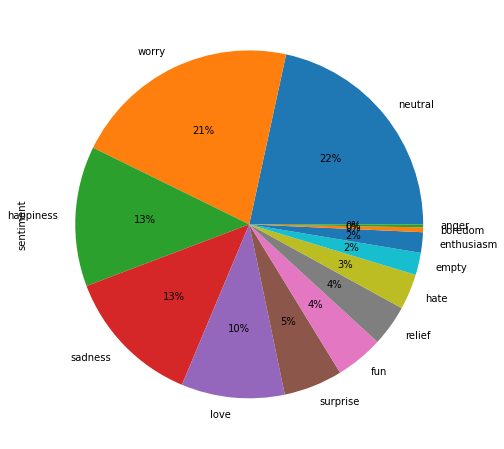

In [ ]:
df_emotion.sentiment.value_counts().plot(kind='pie', autopct='%1.0f%%')

In [ ]:
update_feedback = []

for name in li_feedback:
    update_feedback.append(name.lower())

update_feedback

['@tiffanylue i know  i was listenin to bad habit earlier and i started freakin at his part =[',
 'layin n bed with a headache  ughhhh...waitin on your call...',
 'funeral ceremony...gloomy friday...',
 'wants to hang out with friends soon!',
 '@dannycastillo we want to trade with someone who has houston tickets, but no one will.',
 "re-pinging @ghostridah14: why didn't you go to prom? bc my bf didn't like my friends",
 "i should be sleep, but im not! thinking about an old friend who i want. but he's married now. damn, &amp; he wants me 2! scandalous!",
 'hmmm. http://www.djhero.com/ is down',
 '@charviray charlene my love. i miss you',
 "@kelcouch i'm sorry  at least it's friday?",
 'cant fall asleep',
 'choked on her retainers',
 'ugh! i have to beat this stupid song to get to the next  rude!',
 '@brodyjenner if u watch the hills in london u will realise what tourture it is because were weeks and weeks late  i just watch itonlinelol',
 'got the news',
 'the storm is here and the elec

In [ ]:
update_feedback = [''.join(c for c in s if c not in string.punctuation) for s in update_feedback]
update_feedback

['tiffanylue i know  i was listenin to bad habit earlier and i started freakin at his part ',
 'layin n bed with a headache  ughhhhwaitin on your call',
 'funeral ceremonygloomy friday',
 'wants to hang out with friends soon',
 'dannycastillo we want to trade with someone who has houston tickets but no one will',
 'repinging ghostridah14 why didnt you go to prom bc my bf didnt like my friends',
 'i should be sleep but im not thinking about an old friend who i want but hes married now damn amp he wants me 2 scandalous',
 'hmmm httpwwwdjherocom is down',
 'charviray charlene my love i miss you',
 'kelcouch im sorry  at least its friday',
 'cant fall asleep',
 'choked on her retainers',
 'ugh i have to beat this stupid song to get to the next  rude',
 'brodyjenner if u watch the hills in london u will realise what tourture it is because were weeks and weeks late  i just watch itonlinelol',
 'got the news',
 'the storm is here and the electricity is gone',
 'annarosekerr agreed',
 'so slee

In [ ]:
update_feedback = ["".join(x for x in i if not x.isdigit()) for i in update_feedback] 
update_feedback

['tiffanylue i know  i was listenin to bad habit earlier and i started freakin at his part ',
 'layin n bed with a headache  ughhhhwaitin on your call',
 'funeral ceremonygloomy friday',
 'wants to hang out with friends soon',
 'dannycastillo we want to trade with someone who has houston tickets but no one will',
 'repinging ghostridah why didnt you go to prom bc my bf didnt like my friends',
 'i should be sleep but im not thinking about an old friend who i want but hes married now damn amp he wants me  scandalous',
 'hmmm httpwwwdjherocom is down',
 'charviray charlene my love i miss you',
 'kelcouch im sorry  at least its friday',
 'cant fall asleep',
 'choked on her retainers',
 'ugh i have to beat this stupid song to get to the next  rude',
 'brodyjenner if u watch the hills in london u will realise what tourture it is because were weeks and weeks late  i just watch itonlinelol',
 'got the news',
 'the storm is here and the electricity is gone',
 'annarosekerr agreed',
 'so sleepy 

In [ ]:
tokenized_sents = [' \' ' +' \' , \' '.join(word_tokenize(i))+ ' \' ' for i in update_feedback] 
tokenized_sents

[" ' tiffanylue ' , ' i ' , ' know ' , ' i ' , ' was ' , ' listenin ' , ' to ' , ' bad ' , ' habit ' , ' earlier ' , ' and ' , ' i ' , ' started ' , ' freakin ' , ' at ' , ' his ' , ' part ' ",
 " ' layin ' , ' n ' , ' bed ' , ' with ' , ' a ' , ' headache ' , ' ughhhhwaitin ' , ' on ' , ' your ' , ' call ' ",
 " ' funeral ' , ' ceremonygloomy ' , ' friday ' ",
 " ' wants ' , ' to ' , ' hang ' , ' out ' , ' with ' , ' friends ' , ' soon ' ",
 " ' dannycastillo ' , ' we ' , ' want ' , ' to ' , ' trade ' , ' with ' , ' someone ' , ' who ' , ' has ' , ' houston ' , ' tickets ' , ' but ' , ' no ' , ' one ' , ' will ' ",
 " ' repinging ' , ' ghostridah ' , ' why ' , ' didnt ' , ' you ' , ' go ' , ' to ' , ' prom ' , ' bc ' , ' my ' , ' bf ' , ' didnt ' , ' like ' , ' my ' , ' friends ' ",
 " ' i ' , ' should ' , ' be ' , ' sleep ' , ' but ' , ' im ' , ' not ' , ' thinking ' , ' about ' , ' an ' , ' old ' , ' friend ' , ' who ' , ' i ' , ' want ' , ' but ' , ' hes ' , ' married ' , ' now ' ,

In [ ]:
from pandas import Series, DataFrame
#For Removind Non-English Languages from the List
test_str = Series(tokenized_sents)
test_str.str.findall('[^\W]+')

0        [tiffanylue, i, know, i, was, listenin, to, ba...
1        [layin, n, bed, with, a, headache, ughhhhwaiti...
2                        [funeral, ceremonygloomy, friday]
3              [wants, to, hang, out, with, friends, soon]
4        [dannycastillo, we, want, to, trade, with, som...
                               ...                        
39995                                    [johnlloydtaylor]
39996                 [happy, mothers, day, all, my, love]
39997    [happy, mothers, day, to, all, the, mommies, o...
39998    [niariley, wassup, beautiful, follow, me, peep...
39999    [mopedronin, bullet, train, from, tokyo, the, ...
Length: 40000, dtype: object

In [ ]:
from nltk.corpus import stopwords 
words=tokenized_sents
cachedStopWords = stopwords.words("english")
final_words= [', '.join(word for word in words if word not in cachedStopWords)]
final_words

[" ' tiffanylue ' , ' i ' , ' know ' , ' i ' , ' was ' , ' listenin ' , ' to ' , ' bad ' , ' habit ' , ' earlier ' , ' and ' , ' i ' , ' started ' , ' freakin ' , ' at ' , ' his ' , ' part ' ,  ' layin ' , ' n ' , ' bed ' , ' with ' , ' a ' , ' headache ' , ' ughhhhwaitin ' , ' on ' , ' your ' , ' call ' ,  ' funeral ' , ' ceremonygloomy ' , ' friday ' ,  ' wants ' , ' to ' , ' hang ' , ' out ' , ' with ' , ' friends ' , ' soon ' ,  ' dannycastillo ' , ' we ' , ' want ' , ' to ' , ' trade ' , ' with ' , ' someone ' , ' who ' , ' has ' , ' houston ' , ' tickets ' , ' but ' , ' no ' , ' one ' , ' will ' ,  ' repinging ' , ' ghostridah ' , ' why ' , ' didnt ' , ' you ' , ' go ' , ' to ' , ' prom ' , ' bc ' , ' my ' , ' bf ' , ' didnt ' , ' like ' , ' my ' , ' friends ' ,  ' i ' , ' should ' , ' be ' , ' sleep ' , ' but ' , ' im ' , ' not ' , ' thinking ' , ' about ' , ' an ' , ' old ' , ' friend ' , ' who ' , ' i ' , ' want ' , ' but ' , ' hes ' , ' married ' , ' now ' , ' damn ' , ' amp 

In [ ]:
arr_words = np.array([final_words])
arr_emotions=np.array([df_emotion['sentiment']])

In [ ]:
arr_words

array([[" ' tiffanylue ' , ' i ' , ' know ' , ' i ' , ' was ' , ' listenin ' , ' to ' , ' bad ' , ' habit ' , ' earlier ' , ' and ' , ' i ' , ' started ' , ' freakin ' , ' at ' , ' his ' , ' part ' ,  ' layin ' , ' n ' , ' bed ' , ' with ' , ' a ' , ' headache ' , ' ughhhhwaitin ' , ' on ' , ' your ' , ' call ' ,  ' funeral ' , ' ceremonygloomy ' , ' friday ' ,  ' wants ' , ' to ' , ' hang ' , ' out ' , ' with ' , ' friends ' , ' soon ' ,  ' dannycastillo ' , ' we ' , ' want ' , ' to ' , ' trade ' , ' with ' , ' someone ' , ' who ' , ' has ' , ' houston ' , ' tickets ' , ' but ' , ' no ' , ' one ' , ' will ' ,  ' repinging ' , ' ghostridah ' , ' why ' , ' didnt ' , ' you ' , ' go ' , ' to ' , ' prom ' , ' bc ' , ' my ' , ' bf ' , ' didnt ' , ' like ' , ' my ' , ' friends ' ,  ' i ' , ' should ' , ' be ' , ' sleep ' , ' but ' , ' im ' , ' not ' , ' thinking ' , ' about ' , ' an ' , ' old ' , ' friend ' , ' who ' , ' i ' , ' want ' , ' but ' , ' hes ' , ' married ' , ' now ' , ' damn ' ,

In [ ]:
arr_emotions

array([['empty', 'sadness', 'sadness', ..., 'love', 'happiness', 'love']],
      dtype=object)